In [1]:
import pandas as pd
import numpy as np

import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.linear_model import LinearRegression

import xgboost as xgb
from prophet import Prophet
from xgboost import plot_importance, plot_tree
from catboost import CatBoostRegressor, Pool

# Статистический тест Дики-Фуллера
from statsmodels.tsa.stattools import adfuller

import matplotlib.pyplot as plt 
import plotly.offline as py
import plotly.graph_objs as go
from statsmodels.graphics.tsaplots import plot_predict
py.init_notebook_mode()

%matplotlib inline

In [2]:
df = pd.read_csv('C:\SkillFactory\SF_DataScience\Current_tasks\data\PDA-2\dtrain.csv') # считываем датасет
df.head()

C:\Users\Пользователь\AppData\Local\Temp\ipykernel_1720\3800452792.py:1: DtypeWarning:

Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.



,id,date,store_nbr,item_nbr,unit_sales,onpromotion
0,0,2013-01-01,25,103665,7.0,NaN
1,1,2013-01-01,25,105574,1.0,NaN
2,2,2013-01-01,25,105575,2.0,NaN
3,3,2013-01-01,25,108079,1.0,NaN
4,4,2013-01-01,25,108701,1.0,NaN


In [3]:
# Отбор данных для магазина 25
df_25 = df[df.store_nbr==25].groupby("date")['unit_sales'].sum().reset_index()
df_25.head()

,date,unit_sales
0,2013-01-01,2511.619
1,2013-01-02,5316.224
2,2013-01-03,4442.913
3,2013-01-04,4844.354
4,2013-01-05,5817.526


In [4]:
# Приведение индекса в формат Datetime
df_25 = df_25.set_index(pd.DatetimeIndex(df_25['date']))
df_25.drop(['date'], axis=1, inplace=True)
df_25.head()

,unit_sales
date,
2013-01-01,2511.619
2013-01-02,5316.224
2013-01-03,4442.913
2013-01-04,4844.354
2013-01-05,5817.526


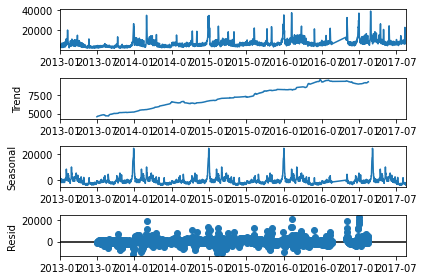

In [5]:
# Разложение ряда на трендовую, сезонную и шумовую составляющие
decomposition = seasonal_decompose(df_25, model='additive', period=365)
decomposition.plot()
plt.show()

In [6]:
trend_part = decomposition.trend # отдельно трендовая составляющаяя
seasonal_part = decomposition.seasonal # отдельно сезонная составляющаяя
residual_part = decomposition.resid # отдельно шум: то, что осталось

In [7]:
print('Ответы на вопросы модуля:')
print(f'1. Сколько элементов содержит исходный датасет? - Ответ: {df.shape[0]}')
print(f'1.1 Сколько элементов содержит отфильтрованный датасет? - Ответ: {df_25.shape[0]}')
print(f'2. Сколько элементов содержит шумовая часть? - Ответ: {residual_part.shape[0]}')
print(f'3. Сколько числовых элементов содержит шумовая часть? - Ответ: {residual_part.dropna().shape[0]}')
print(f'4. Сколько элементов содержит сезонная часть? - Ответ: {seasonal_part.shape[0]}')
print(f'5. Сколько числовых элементов содержит трендовая часть? - Ответ: {trend_part.dropna().shape[0]}')

Ответы на вопросы модуля:
1. Сколько элементов содержит исходный датасет? - Ответ: 125497040
1.1 Сколько элементов содержит отфильтрованный датасет? - Ответ: 1618
2. Сколько элементов содержит шумовая часть? - Ответ: 1618
3. Сколько числовых элементов содержит шумовая часть? - Ответ: 1254
4. Сколько элементов содержит сезонная часть? - Ответ: 1618
5. Сколько числовых элементов содержит трендовая часть? - Ответ: 1254


In [8]:
# Выполнение теста Дики-Фуллера на стационарность
test = adfuller(df_25)
print('Выполнение статистического теста на стационарность:')
print ('adf: ', test[0] )
print ('p-value: ', test[1])
print ('Critical values: ', test[4])
if test[0]> test[4]['5%']: # проверка, больше ли критического полученное значение для нашего ряда 
    print ('Ответ: ряд не стационарен')
else:
    print ('Ответ: ряд стационарен')

Выполнение статистического теста на стационарность:
adf:  -4.858992665318181
p-value:  4.1883941929077723e-05
Critical values:  {'1%': -3.4344642432857992, '5%': -2.8633571955690647, '10%': -2.5677374399794197}
Ответ: ряд стационарен


In [9]:
# Разеделение датасета на тренировочную и тестовую выборки
tscv = TimeSeriesSplit(n_splits=3, test_size=7)
train_test_groups = tscv.split(df_25) 
for train_index, test_index in train_test_groups:
    print("TRAIN size:", len(train_index), "TEST size:", len(test_index))

TRAIN size: 1597 TEST size: 7
TRAIN size: 1604 TEST size: 7
TRAIN size: 1611 TEST size: 7


In [10]:
# Расчет факторов
# Скользящее среднее c окном 5
df_25['rolling_mean'] = df_25.unit_sales.rolling(window=5).mean()
# Скользящее квадратическое отклонение c окном 5
df_25['rolling_std']  = df_25.unit_sales.rolling(window=5).std()
# Линии Боллинджера с окном в 30
df_25['Bol_upper'] = df_25.unit_sales.rolling(window=30).mean() + 3*df_25.unit_sales.rolling(window=30).std()
df_25['Bol_lower'] = df_25.unit_sales.rolling(window=30).mean() - 3*df_25.unit_sales.rolling(window=30).std()

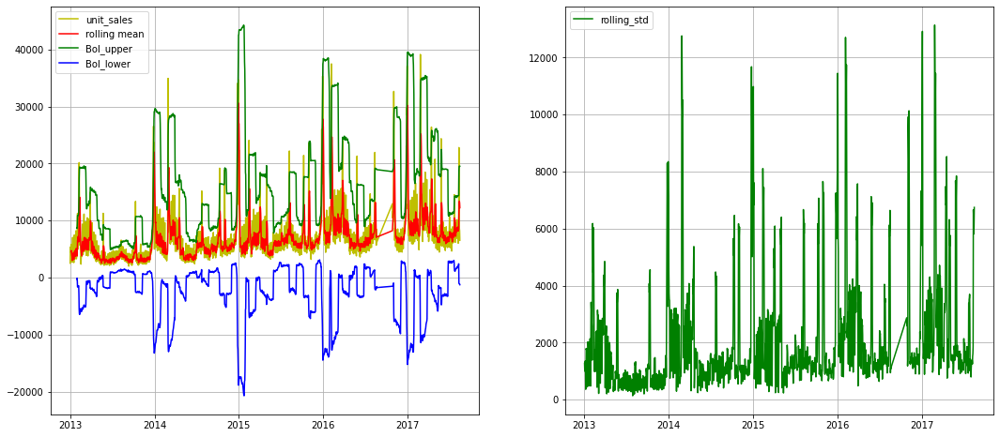

In [11]:
## Визуализация
f, ax = plt.subplots(1, 2, figsize=(18, 8))
ax[0].plot(df_25.index, df_25.unit_sales, c='y') ## исходные данные
ax[0].plot(df_25.index, df_25.rolling_mean, c='r') ## оконное среднее
ax[0].plot(df_25.index, df_25.Bol_upper,  c='g') ## линии Боллинджера
ax[0].plot(df_25.index, df_25.Bol_lower,  c='b') ## линии Боллинджера
ax[0].legend(['unit_sales', 'rolling mean', 'Bol_upper', 'Bol_lower'])
ax[0].grid()

ax[1].plot(df_25.index, df_25.rolling_std, c='g') ## оконное стандартное отклонение
ax[1].legend(['rolling_std'])
ax[1].grid()
plt.show()

In [12]:
## делаем оконное среднее с окном в 10 точек
df_25['rolling_mean_' + str(10)] = df_25.unit_sales.rolling(window=10).mean()
## экспоненциально среднее с окном в 7 точек
df_25['rolling_ema_' + str(7)] = df_25.unit_sales.ewm(min_periods=7, span=7).mean()

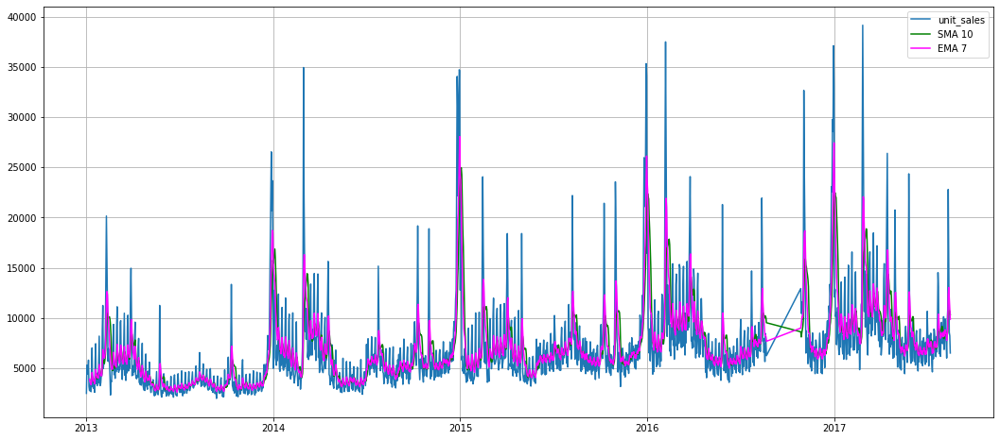

In [13]:
## визуализация
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(df_25.index, df_25.unit_sales) ## исходные данные
# ax.plot(df.ts, df.rolling_mean_10, c='r') ## оконное среднее
ax.plot(df_25.index, df_25['rolling_mean_' + str(10)],  c='g') ## оконное среднее
ax.plot(df_25.index, df_25['rolling_ema_'  + str(7)],  c='magenta') ## оконное экспоненциально среднее
ax.legend(['unit_sales', 'SMA ' + str(10), 'EMA ' + str(7)])
ax.grid()

In [14]:
# Вычисление индексов по требуемым условиям
mean_dif = np.sign(df_25.unit_sales.rolling(window=50).mean() - df_25.unit_sales.ewm(min_periods=10, span=10).mean()).diff()
mean_dif[mean_dif > 0].index

DatetimeIndex(['2013-02-20', '2013-02-26', '2013-03-05', '2013-03-11',
               '2013-03-17', '2013-03-24', '2013-04-08', '2013-05-28',
               '2013-07-01', '2013-07-08', '2013-08-27', '2013-09-02',
               '2013-10-21', '2013-11-03', '2013-12-05', '2014-01-16',
               '2014-01-19', '2014-04-01', '2014-04-20', '2014-06-09',
               '2014-06-24', '2014-08-06', '2014-09-08', '2014-09-23',
               '2014-09-25', '2014-10-20', '2014-11-07', '2014-12-02',
               '2014-12-07', '2015-01-10', '2015-02-25', '2015-03-02',
               '2015-03-10', '2015-03-16', '2015-03-23', '2015-03-30',
               '2015-04-13', '2015-05-05', '2015-07-16', '2015-07-30',
               '2015-08-19', '2015-08-23', '2015-10-20', '2015-11-09',
               '2016-01-11', '2016-02-15', '2016-02-23', '2016-02-29',
               '2016-03-06', '2016-04-05', '2016-04-10', '2016-06-06',
               '2016-07-05', '2016-07-12', '2016-11-11', '2017-01-11',
      

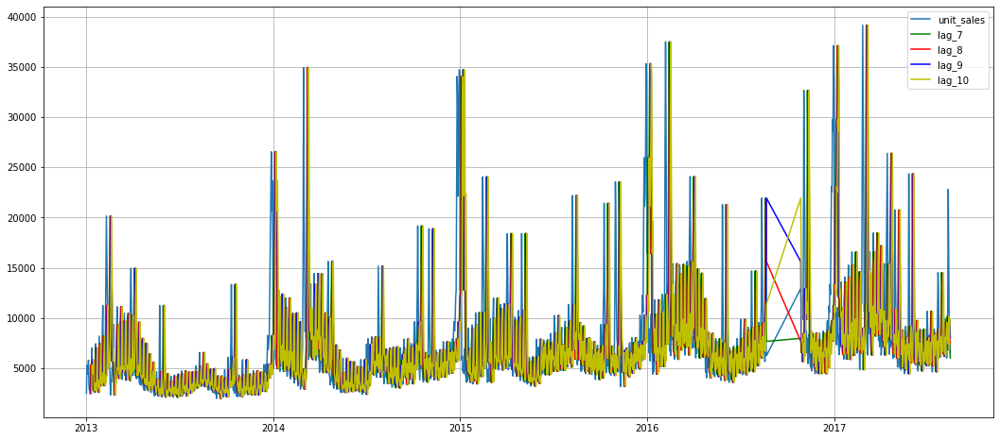

In [15]:
for i in range(7,11):
    df_25['lag_{}'.format(i)] = df_25.unit_sales.shift(i)


## Визуализация
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(df_25.index, df_25.unit_sales) ## исходные данные
ax.plot(df_25.index, df_25['lag_' + str(7)],  c='g') 
ax.plot(df_25.index, df_25['lag_' + str(8)],  c='r') 
ax.plot(df_25.index, df_25['lag_' + str(9)],  c='b') 
ax.plot(df_25.index, df_25['lag_' + str(10)],  c='y') 
ax.legend(['unit_sales', 'lag_7', 'lag_8', 'lag_9', 'lag_10'])
ax.grid()

# Построение модели скользящего среднего

In [16]:
# Отбор требуемых по заданию данных
df_103501 = df[df.item_nbr == 103501].groupby('date').sum()['unit_sales'].reset_index()
df_103501.head()

,date,unit_sales
0,2013-01-02,185.0
1,2013-01-03,153.0
2,2013-01-04,155.0
3,2013-01-05,160.0
4,2013-01-06,173.0


In [17]:
# Приведение индекса в формат Datetime
df_103501 = df_103501.set_index(pd.DatetimeIndex(df_103501['date']))
df_103501.drop(['date'], axis=1, inplace=True)
df_103501.head()

,unit_sales
date,
2013-01-02,185.0
2013-01-03,153.0
2013-01-04,155.0
2013-01-05,160.0
2013-01-06,173.0


In [18]:
# Выполнение теста Дики-Фуллера на стационарность
test = adfuller(df_103501)
print('Выполнение статистического теста на стационарность:')
print ('adf: ', test[0] )
print ('p-value: ', test[1])
print ('Critical values: ', test[4])
if test[0]> test[4]['5%']: # проверка, больше ли критического полученное значение для нашего ряда 
    print ('Ответ: ряд не стационарен')
else:
    print ('Ответ: ряд стационарен')

Выполнение статистического теста на стационарность:
adf:  -4.15440305801462
p-value:  0.0007863083913836295
Critical values:  {'1%': -3.4344462031760283, '5%': -2.8633492329988335, '10%': -2.5677331999518147}
Ответ: ряд стационарен


Ряд - стационарный. Если бы ряд был нестационарным, нам необходимо было бы продифференцировать ряд до тех пор, пока бы мы не получили стационарный ряд. Количество дифференцирований будет опреледелять пораметр d в модели ARIMA. В нашем случае d=0, так как к дифференцированию мы не прибегали.

(6,) (6, 1)
mean_squared_error 287.09
mean_absolute_error 13.42
mean_absolute_percentage_error 17.0


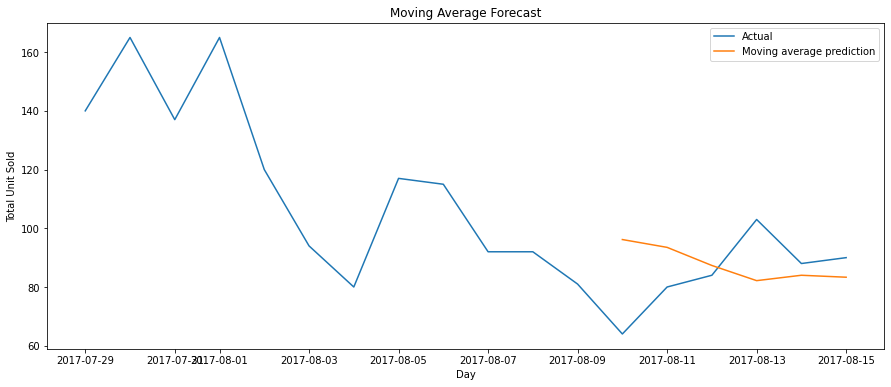

In [19]:
# Модель скользящего среднего
def moving_average_forecast(series, window_size):
    forecast = []
    for time in range(len(series) - window_size):
        forecast.append(series[time:time + window_size].values.mean())
    return np.array(forecast)


moving_average_days = 6

shown_train_size = moving_average_days * 3
moving_avg = moving_average_forecast(df_103501, moving_average_days)
moving_avg = pd.Series(moving_avg, index = df_103501[moving_average_days:].index)

print(moving_avg[-moving_average_days:].shape, df_103501[-moving_average_days:].shape)

print("mean_squared_error", round(mean_squared_error(df_103501.values[-moving_average_days:], moving_avg[-moving_average_days:]), 2))
print("mean_absolute_error", round(mean_absolute_error(df_103501.values[-moving_average_days:], moving_avg[-moving_average_days:]), 2))
print("mean_absolute_percentage_error", round(mean_absolute_percentage_error(df_103501.values[-moving_average_days:], moving_avg[-moving_average_days:]), 2) * 100)

plt.figure(figsize=(15,6))

plt.plot(df_103501[- shown_train_size:], label="Actual")
plt.plot(moving_avg[-moving_average_days:], label="Moving average prediction")
plt.ylabel("Total Unit Sold")
plt.xlabel("Day")
plt.title("Moving Average Forecast")
plt.legend(loc="upper right");

# Построение линейной регрессии

In [20]:
# построение Лагов с 1 по 6
df_lags = pd.DataFrame()

df_lags["Original Values"]  = df_103501
df_lags["shift1"] = df_lags["Original Values"].shift()
df_lags["shift2"] = df_lags["shift1"].shift()
df_lags["shift3"] = df_lags["shift2"].shift()
df_lags["shift4"] = df_lags["shift3"].shift()
df_lags["shift5"] = df_lags["shift4"].shift()
df_lags["shift6"] = df_lags["shift5"].shift()

df_lags.dropna(inplace=True)

In [21]:
# Разбиение на тренировочные и тестовые выборки
predict_size = 3

x_train, y_train = df_lags[:-predict_size].drop(["Original Values"], axis =1), df_lags[:-predict_size]["Original Values"]
x_test, y_test  = df_lags[-predict_size:].drop(["Original Values"], axis =1), df_lags[-predict_size:]["Original Values"]

[ 0.64655858 -0.09516676 -0.00451244 -0.00140731 -0.07257917  0.31685028]
21.21131709724834
mean_squared_error 128.34
mean_absolute_error 9.61
mean_absolute_percentage_error 10.0


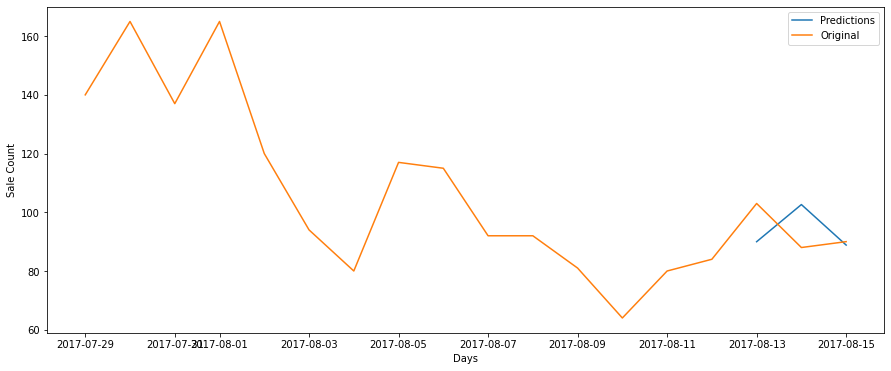

In [22]:
reg = LinearRegression().fit(x_train, y_train)
print(reg.coef_)
print(reg.intercept_)


ar_predictions = pd.Series(reg.predict(x_test), index=x_test.index)

plt.figure(figsize=(15,6))
plt.plot(ar_predictions ,label = "Predictions")
plt.plot(pd.concat([y_train, y_test], axis = 0)[-shown_train_size:], label = "Original" )
plt.xlabel("Days")
plt.ylabel("Sale Count")

print("mean_squared_error", round(mean_squared_error(y_test, ar_predictions), 2))
print("mean_absolute_error", round(mean_absolute_error(y_test, ar_predictions), 2))
print("mean_absolute_percentage_error", round(mean_absolute_percentage_error(y_test, ar_predictions), 2) * 100)

plt.legend(loc="upper right")

# Построение модели ARIMA

Чтобы построить ARIMA модель нам нужно знать ее порядок, состоящий из 3-х параметров:
    
    p — порядок компоненты AR
    d — порядок интегрированного ряда
    q — порядок компонетны MA
    
d мы уже знаем - это 0

осталось определить p и q. Для их определения нам надо изучить авторкорреляционную(ACF) и частично автокорреляционную(PACF) функции для ряда первых разностей.

ACF поможет нам определить q, т. к. по ее коррелограмме можно определить количество автокорреляционных коэффициентов сильно отличных от 0 в модели MA
PACF поможет нам определить p, т. к. по ее коррелограмме можно определить максимальный номер коэффициента сильно отличный от 0 в модели AR.

Чтобы построить соответствующие коррелограммы, в пакете statsmodels имеются следующие функции: plot_acf() и plot_pacf(). Они выводят графики ACF и PACF, у которых по оси X откладываются номера лагов, а по оси Y значения соответствующих функций. Нужно отметить, что количество лагов в функциях и определяет число значимых коэффициентов.

c:\Users\Пользователь\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



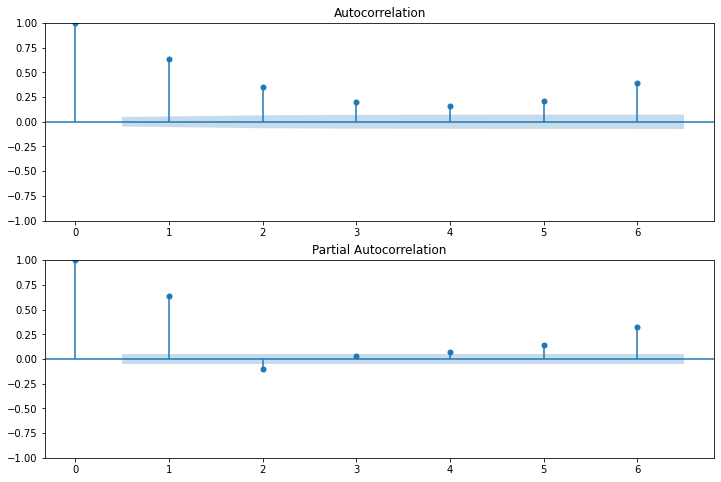

In [23]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_103501.values.squeeze(), lags=6, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_103501, lags=6, ax=ax2)

После изучения коррелограммы PACF можно сделать вывод, что p = 6, т.к. на ней все лаги сильно отличны от нуля.
По коррелограмме ACF можно предположить, что q = 6, т.к. на лаг 6 значении функций резко возрастает.

In [24]:
# Создание ARIMA модели
arima_model = ARIMA(y_train.values.reshape(-1), order=(6,0,6))

c:\Users\Пользователь\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\Пользователь\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\Пользователь\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



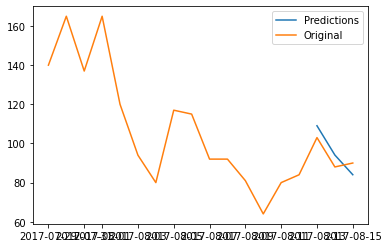

In [25]:
train_size = len(y_train)
test_size = predict_size
arima_predictions = arima_model.fit().predict(start=train_size, end=train_size+test_size -1,  dynamic=False)

plt.plot(pd.Series(arima_predictions, index=y_test.index), label = "Predictions")
plt.plot(pd.concat([y_train, y_test], axis = 0)[-shown_train_size:], label = "Original" )
plt.legend(loc="upper right");

# Построение модели SARIMA

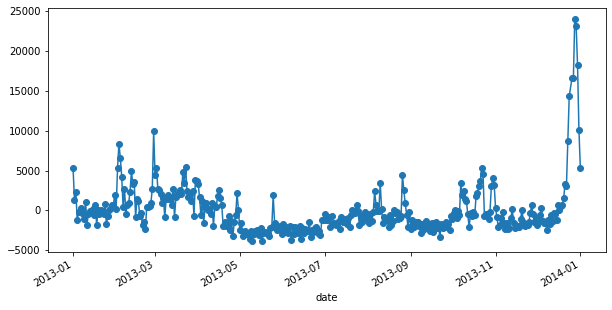

In [26]:
plt.rcParams["figure.figsize"] = 10, 5
seasonal_part[:365].plot(marker = "o")
plt.show()

c:\Users\Пользователь\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



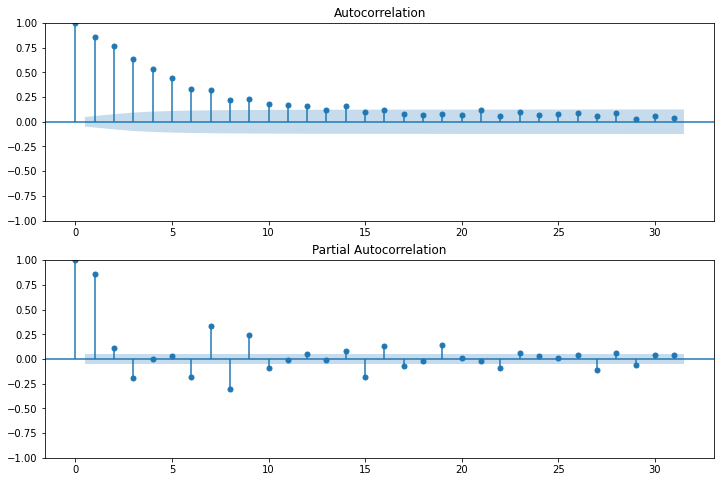

In [40]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(seasonal_part.squeeze(), lags=31, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(seasonal_part, lags=31, ax=ax2)

In [41]:
sarima_model = SARIMAX(y_train.values.reshape(-1), order = (6, 0, 6), seasonal_order = (15, 0, 12, 12))

c:\Users\Пользователь\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\Пользователь\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\Пользователь\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:997: UserWarning:

Non-stationary starting seasonal autoregressive Using zeros as starting parameters.

c:\Users\Пользователь\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



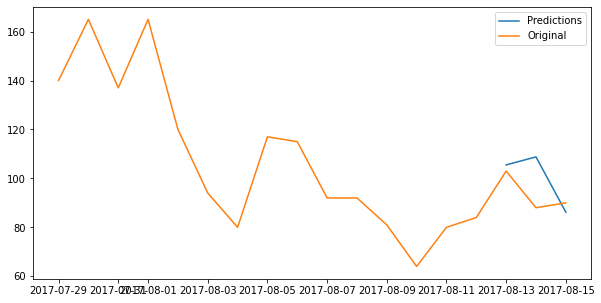

In [42]:
train_size = len(y_train)
test_size = predict_size
sarima_predictions = sarima_model.fit().predict(start=train_size, end=train_size+test_size-1,  dynamic=False)

plt.plot(pd.Series(sarima_predictions, index=y_test.index), label = "Predictions")
plt.plot(pd.concat([y_train, y_test], axis = 0)[-shown_train_size:], label = "Original" )
plt.legend(loc="upper right");

In [43]:
# Сводные результаты по построенным моделям
print('Метрики модели среднего скользящего:')
print("mean_squared_erro r=", round(mean_squared_error(df_103501.values[-moving_average_days:], moving_avg[-moving_average_days:]), 2))
print("mean_absolute_error =", round(mean_absolute_error(df_103501.values[-moving_average_days:], moving_avg[-moving_average_days:]), 2))
print("mean_absolute_percentage_error =", round(mean_absolute_percentage_error(df_103501.values[-moving_average_days:], moving_avg[-moving_average_days:]), 2) * 100)

print('Метрики модели линейной регрессии:')
print("mean_squared_error =", round(mean_squared_error(y_test, ar_predictions), 2))
print("mean_absolute_error =", round(mean_absolute_error(y_test, ar_predictions), 2))
print("mean_absolute_percentage_error =", round(mean_absolute_percentage_error(y_test, ar_predictions), 2) * 100)

print('Метрики модели ARIMA:')
print("mean_squared_error =", round(mean_squared_error(y_test, arima_predictions), 2))
print("mean_absolute_error =", round(mean_absolute_error(y_test, arima_predictions), 2))
print("mean_absolute_percentage_error =", round(mean_absolute_percentage_error(y_test, arima_predictions), 2) * 100)

print('Метрики модели SARIMA:')
print("mean_squared_error =", round(mean_squared_error(y_test, sarima_predictions), 2))
print("mean_absolute_error =", round(mean_absolute_error(y_test, sarima_predictions), 2))
print("mean_absolute_percentage_error =", round(mean_absolute_percentage_error(y_test, sarima_predictions), 2) * 100)

Метрики модели среднего скользящего:
mean_squared_erro r= 287.09
mean_absolute_error = 13.42
mean_absolute_percentage_error = 17.0
Метрики модели линейной регрессии:
mean_squared_error = 128.34
mean_absolute_error = 9.61
mean_absolute_percentage_error = 10.0
Метрики модели ARIMA:
mean_squared_error = 36.41
mean_absolute_error = 6.03
mean_absolute_percentage_error = 6.0
Метрики модели SARIMA:
mean_squared_error = 150.9
mean_absolute_error = 9.04
mean_absolute_percentage_error = 10.0


Вывод: c точки зрения значений метрик наилучшей моделью является модель ARIMA. При этом модель SARIMA может быть улучшено более точным подбором сезонных коэффициентов.

# Построение модели Prophet

In [44]:
df_holidays_events = pd.read_csv('C:\SkillFactory\SF_DataScience\Current_tasks\data\PDA-2\holidays_events.csv')
holidays = df_holidays_events[df_holidays_events['transferred'] == False][['description', 'date']]
holidays.columns = ['holiday', 'ds']
holidays

,holiday,ds
0,Fundacion de Manta,2012-03-02
1,Provincializacion de Cotopaxi,2012-04-01
2,Fundacion de Cuenca,2012-04-12
3,Cantonizacion de Libertad,2012-04-14
4,Cantonizacion de Riobamba,2012-04-21
...,...,...
345,Navidad-3,2017-12-22
346,Navidad-2,2017-12-23
347,Navidad-1,2017-12-24
348,Navidad,2017-12-25


In [45]:
# Подготовка данных
sales = df.groupby('date')['unit_sales'].sum()
py.iplot([go.Scatter(
    x=sales.index,
    y=sales
)])

sales = pd.DataFrame(sales).reset_index()
sales.columns = ['ds', 'y']

In [46]:
# Построение модели
m = Prophet()
m.fit(sales)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
forecast

12:08:38 - cmdstanpy - INFO - Chain [1] start processing
12:08:39 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,335515.877479,242247.777514,5.198729e+05,335515.877479,3.355159e+05,43399.477956,43399.477956,43399.477956,-68157.771510,-68157.771510,-68157.771510,111557.249466,111557.249466,111557.249466,0.0,0.0,0.0,3.789154e+05
1,2013-01-02,335880.156766,249386.518141,5.306465e+05,335880.156766,3.358802e+05,55417.734162,55417.734162,55417.734162,-44204.882248,-44204.882248,-44204.882248,99622.616410,99622.616410,99622.616410,0.0,0.0,0.0,3.912979e+05
2,2013-01-03,336244.436053,156795.741673,4.335981e+05,336244.436053,3.362444e+05,-44207.127232,-44207.127232,-44207.127232,-131875.877701,-131875.877701,-131875.877701,87668.750469,87668.750469,87668.750469,0.0,0.0,0.0,2.920373e+05
3,2013-01-04,336608.715340,224754.042047,4.968073e+05,336608.715340,3.366087e+05,18836.907088,18836.907088,18836.907088,-57037.126739,-57037.126739,-57037.126739,75874.033827,75874.033827,75874.033827,0.0,0.0,0.0,3.554456e+05
4,2013-01-05,336972.994627,398987.766953,6.776801e+05,336972.994627,3.369730e+05,198410.759916,198410.759916,198410.759916,134004.018786,134004.018786,134004.018786,64406.741129,64406.741129,64406.741129,0.0,0.0,0.0,5.353838e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2044,2018-08-11,987778.395860,898790.030637,1.185564e+06,943059.652074,1.031701e+06,62901.402042,62901.402042,62901.402042,134004.018786,134004.018786,134004.018786,-71102.616744,-71102.616744,-71102.616744,0.0,0.0,0.0,1.050680e+06
2045,2018-08-12,988036.470703,960460.018986,1.245129e+06,942995.275691,1.032259e+06,116803.571364,116803.571364,116803.571364,188407.756316,188407.756316,188407.756316,-71604.184953,-71604.184953,-71604.184953,0.0,0.0,0.0,1.104840e+06
2046,2018-08-13,988294.545546,758722.073672,1.050087e+06,943000.524979,1.032689e+06,-92581.853467,-92581.853467,-92581.853467,-21136.116905,-21136.116905,-21136.116905,-71445.736562,-71445.736562,-71445.736562,0.0,0.0,0.0,8.957127e+05
2047,2018-08-14,988552.620388,702798.254065,9.859602e+05,943113.672185,1.033112e+06,-138786.646782,-138786.646782,-138786.646782,-68157.771510,-68157.771510,-68157.771510,-70628.875272,-70628.875272,-70628.875272,0.0,0.0,0.0,8.497660e+05


In [47]:
# Визуализация
py.iplot([
    go.Scatter(x=sales['ds'], y=sales['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

In [48]:
# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-sales['y'])**2)) )

RMSE: 108116.566582


In [49]:

scale_list = [0.01, 0.1, 1, 1.5, 2, 2.5]
for scale in scale_list:
    m = Prophet(changepoint_prior_scale=scale)
    m.fit(sales)
    future = m.make_future_dataframe(periods=365)
    forecast = m.predict(future)
    
    py.iplot([
    go.Scatter(x=sales['ds'], y=sales['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
    ])
    
    print(f'RMSE (changepoint_prior_sacele = {scale}): %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-sales['y'])**2)) )
    

12:08:41 - cmdstanpy - INFO - Chain [1] start processing
12:08:41 - cmdstanpy - INFO - Chain [1] done processing


RMSE (changepoint_prior_sacele = 0.01): 110872.847600


12:08:42 - cmdstanpy - INFO - Chain [1] start processing
12:08:43 - cmdstanpy - INFO - Chain [1] done processing


RMSE (changepoint_prior_sacele = 0.1): 104506.326302


12:08:45 - cmdstanpy - INFO - Chain [1] start processing
12:08:47 - cmdstanpy - INFO - Chain [1] done processing


RMSE (changepoint_prior_sacele = 1): 97791.656048


12:08:48 - cmdstanpy - INFO - Chain [1] start processing
12:08:49 - cmdstanpy - INFO - Chain [1] done processing


RMSE (changepoint_prior_sacele = 1.5): 97632.030538


12:08:51 - cmdstanpy - INFO - Chain [1] start processing
12:08:53 - cmdstanpy - INFO - Chain [1] done processing


RMSE (changepoint_prior_sacele = 2): 97539.051519


12:08:55 - cmdstanpy - INFO - Chain [1] start processing
12:08:56 - cmdstanpy - INFO - Chain [1] done processing


RMSE (changepoint_prior_sacele = 2.5): 97505.116462


Вывод:
- чем меньше параметр changepoint_prior_scale, тем менее гибок тренд;
- для большей гибкости необходимо увеличивать параметр changepoint_prior_scale;
- модель получилась недообученной;
- в качестве итогового принят параметр changepoint_prior_scale=2.5, RMSE составляет 97505.11 (против 108116.57 при стандартных настройках).

In [50]:
# Добавление месячной сезонности
m = Prophet(changepoint_prior_scale=2.5, holidays=holidays)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(sales)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

12:08:59 - cmdstanpy - INFO - Chain [1] start processing
12:09:03 - cmdstanpy - INFO - Chain [1] done processing


In [51]:
# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-sales['y'])**2)) )
py.iplot([
    go.Scatter(x=sales['ds'], y=sales['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

RMSE: 74171.534117


Вывод:

Добавление месячной сезонности улучшило показатель метрики RMSE до 74171.53. При этом модель все еще не смогла улавить скачок вниз в 2017 году.

# Построение модели с использованием XGBoost

In [52]:
split_date = '2016-01-01'
sales_train = sales.loc[sales.ds <= split_date].copy()
sales_test = sales.loc[sales.ds > split_date].copy()

In [53]:
sales_train = sales_train.set_index(pd.DatetimeIndex(sales_train['ds']))
sales_train.drop(['ds'], axis=1, inplace=True)
sales_test = sales_test.set_index(pd.DatetimeIndex(sales_test['ds']))
sales_test.drop(['ds'], axis=1, inplace=True)

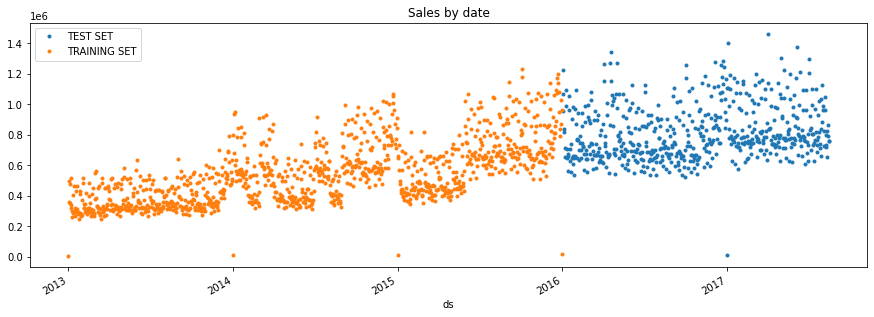

In [54]:
_ = sales_test \
    .rename(columns={'y': 'TEST SET'}) \
    .join(sales_train.rename(columns={'y': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Sales by date', style='.')

In [55]:
# Функция создания признаков
def create_features(df, label=None):
    """
    создаем признаки из datetime индекса
    """
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.isocalendar().week
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

In [56]:
X_train, y_train = create_features(sales_train, label='y')
X_test, y_test = create_features(sales_test, label='y')

In [57]:
X_train = X_train.astype({'weekofyear':np.int64})
X_test = X_test.astype({'weekofyear':np.int64})

In [58]:
# Создание модели XGBRegressor
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

c:\Users\Пользователь\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\sklearn.py:793: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, reg_lambda=1, ...)

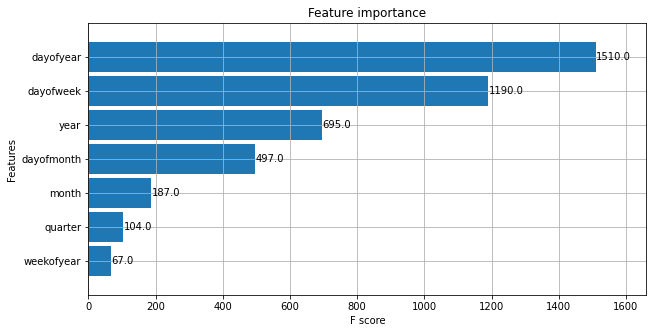

In [59]:
# Визуализация важности признаков
_ = plot_importance(reg, height=0.9)

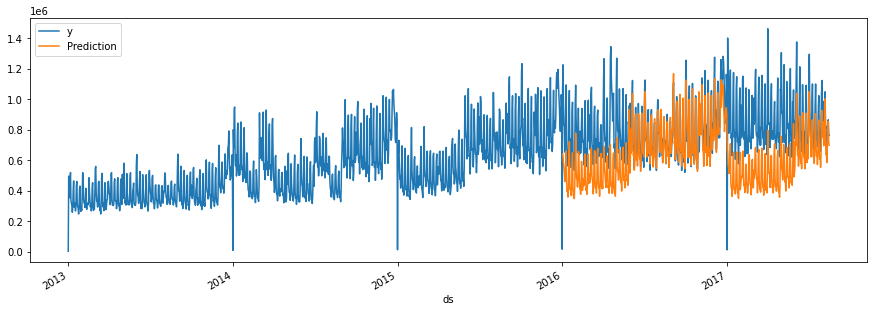

In [60]:
# Выполнение предсказания
sales_test['Prediction'] = reg.predict(X_test)
sales_all = pd.concat([sales_test, sales_train], sort=False)

# Визуализация
_ = sales_all[['y','Prediction']].plot(figsize=(15, 5))

In [61]:
print('Метрики модели XGBRegressor:')
print("mean_squared_error =", round(mean_squared_error(sales_test.y, sales_test.Prediction), 2))
print("mean_absolute_error =", round(mean_absolute_error(sales_test.y, sales_test.Prediction), 2))
print("mean_absolute_percentage_error =", round(mean_absolute_percentage_error(sales_test.y, sales_test.Prediction), 2) * 100)

Метрики модели XGBRegressor:
mean_squared_error = 61906229141.89
mean_absolute_error = 195362.54
mean_absolute_percentage_error = 32.0


# Построение модели с использованием CatBoost

In [62]:
cbr = CatBoostRegressor(n_estimators=1000)
cbr.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
        verbose=False)

<AxesSubplot:ylabel='feature_names'>

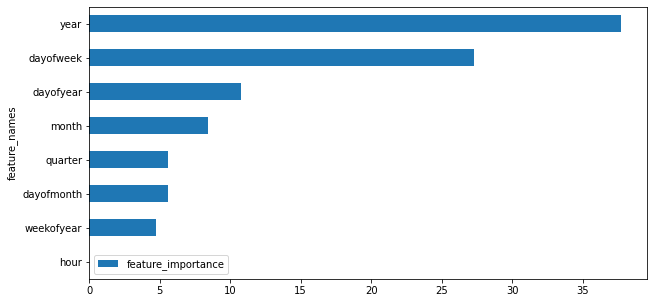

In [63]:
# Визуализация важности признаков
imp_data = pd.DataFrame({'feature_importance': cbr.get_feature_importance(Pool(X_train, y_train)), 
              'feature_names': X_train.columns}).sort_values(by=['feature_importance'], 
                                                       ascending=False)

imp_data.sort_values(by=['feature_importance'], ascending=True).plot.barh(x='feature_names', y='feature_importance')

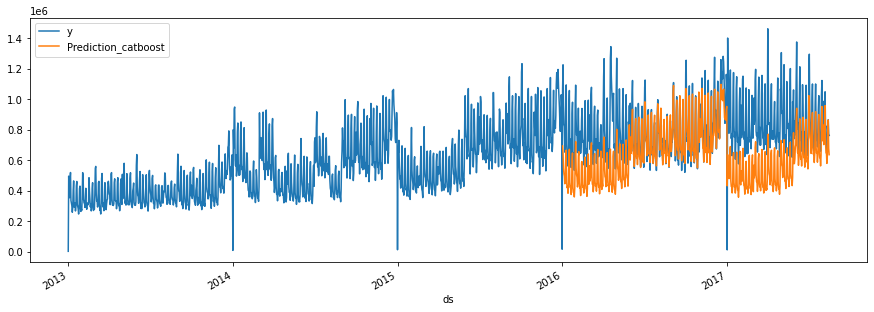

In [64]:
# Выполнение предсказания
sales_test['Prediction_catboost'] = cbr.predict(X_test)
sales_all = pd.concat([sales_test, sales_train], sort=False)

# Визуализация
_ = sales_all[['y','Prediction_catboost']].plot(figsize=(15, 5))

In [65]:
print('Метрики модели CatBoostRegressor:')
print("mean_squared_error =", round(mean_squared_error(sales_test.y, sales_test.Prediction_catboost), 2))
print("mean_absolute_error =", round(mean_absolute_error(sales_test.y, sales_test.Prediction_catboost), 2))
print("mean_absolute_percentage_error =", round(mean_absolute_percentage_error(sales_test.y, sales_test.Prediction_catboost), 2) * 100)

Метрики модели CatBoostRegressor:
mean_squared_error = 61020426022.17
mean_absolute_error = 195731.24
mean_absolute_percentage_error = 28.999999999999996


Вывод:
- Показатель mean_squared_error у модели CatBoostRegressor показывает лучший результат, чем у модели XGBRegressor;
- Показатель mean_absolute_error у модели XGBRegressor показывает лучший результат, чем у модели CatBoostRegressor;
- Показатель mean_absolute_percentage_error у модели CatBoostRegressor показывает лучший результат, чем у модели XGBRegressor;
- Важность признаков для моделей XGBRegressor и CatBoostRegressor оказались разными.

В целом прогноз достаточно сильно отклоняется от истинных показателей в первой половине каждого из прогнозируемых годов. Необходимо добавление дополнительных признаков.